In [1]:
######### Importing the necessary libraries #########


import pandas as pd
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
%matplotlib inline   

In [2]:
###### Fetching the cleaned FM transmitter data for the countries: CANADA, AUSTRALIA and GERMANY ####
#####  EIRP in Watts #####
##### Latitude ranges from 90(N.Pole) to 0 (EQUATOR) to -90(S.Pole) ########
##### Longitude ranges between 0 and 360 degree eastwards ############


#Reading the CSV file
df=pd.read_csv("/home/ghoshsonia/rfi/Final_Revised.csv")

#Removing the Null/missing values in the CSV file
df.dropna(subset = ["Latitude in degrees"], inplace=True)


#df.set_index("Area Served", inplace = True) # Set 'Area Served' column as index on a Dataframe
#df=df.loc[["Perth", "Perth City"]] # Using the operator .loc[] to select multiple rows from the Dataframe
df

,Latitude in degrees,Longitude in degrees,Frequency(MHz),EIRP
0,50.947181,8.532986,87.6,164000.0
1,53.509289,10.093932,87.6,131200.0
2,49.832397,9.592726,87.6,41000.0
3,49.629033,7.820645,87.6,820.0
4,49.681928,7.327415,87.6,328.0
...,...,...,...,...
14102,-25.234722,130.991944,99.7,524.8
14103,-25.234722,130.991944,100.5,524.8
14104,-25.234722,130.991944,102.1,328.0
14105,-25.234722,130.991944,105.3,656.0


In [3]:
#Resolution of the map
print('-----------Resolution of the map---------') 
nside = 64
print("The number of pixels for the given NSIDE: " + str(hp.nside2npix(nside)))
print("Approximate resolution in degrees for given nside: " + str(np.degrees(hp.nside2resol(nside))))
print( "Pixel area: %.2f square degrees" % hp.nside2pixarea(nside, degrees=True))



-----------Resolution of the map---------
The number of pixels for the given NSIDE: 49152
Approximate resolution in degrees for given nside: 0.9161297098179749
Pixel area: 0.84 square degrees


In [4]:

######-------------------Allocating Pixel number to the Latitude and Longitude of each Tx in the CSV---------#######



# Healpy pixel number when input angles are assumed to be longitude and latitude in degrees
pixel_indices = hp.ang2pix(nside, df['Longitude in degrees'].to_numpy() ,df['Latitude in degrees'].to_numpy(),lonlat=True)
df['Pixel_number']=pixel_indices 
print(pixel_indices)

df

[ 5308  4709  5729 ... 35037 35037 35562]


,Latitude in degrees,Longitude in degrees,Frequency(MHz),EIRP,Pixel_number
0,50.947181,8.532986,87.6,164000.0,5308
1,53.509289,10.093932,87.6,131200.0,4709
2,49.832397,9.592726,87.6,41000.0,5729
3,49.629033,7.820645,87.6,820.0,5728
4,49.681928,7.327415,87.6,328.0,5728
...,...,...,...,...,...
14102,-25.234722,130.991944,99.7,524.8,35037
14103,-25.234722,130.991944,100.5,524.8,35037
14104,-25.234722,130.991944,102.1,328.0,35037
14105,-25.234722,130.991944,105.3,656.0,35037


In [5]:
#######---------------Conversion of the pixel numbers w.r.t the given NSIDE to corresponding angular coordinates--------#######


NPIX = hp.nside2npix(nside) # Storing the number of pixels of the map corresponding to the given NSIDE
arr=np.arange(NPIX) #Create an an array of pixel numbers with respect to the NSIDE
theta, phi = (hp.pix2ang(nside, ipix=arr,lonlat=True)) # Array of the angular coordinates co-latitude(theta) 
                                                        #and longitude(phi) in degrees 
                                                       # With respect to the given NSIDE


In [6]:
theta

array([ 45., 135., 225., ..., 135., 225., 315.])

In [7]:
phi

array([ 89.26902929,  89.26902929,  89.26902929, ..., -89.26902929,
       -89.26902929, -89.26902929])

In [8]:
#######------------------Altitudes of the satellite orbit--------####


#Creating user defined data points between 400 km to 36000 km in log scale
data_point=int(input("Enter number of data points : "))
altitude= np.logspace(np.log10(400),np.log10(36000),data_point) 
print(altitude)

Enter number of data points : 5
[  400.         1232.0281153  3794.7331922 11688.0449571 36000.       ]


In [9]:
###########----------------- Calculation of Field of view of the satellite---------#######
###########-----------------Considering Nadir-pointing Field of View Geometry-------######
##########-----------------Considering the FOV of the satellite to be tangent to the surface of the Earth------######


FOV=np.zeros(len(altitude))
for i in range(0,len(altitude)):
# Consider a case of full coverage under elevation of 0 º
    Rad= 6371 # Mean radius of Earth in km
    FOV[i]= 2*np.arcsin(Rad/(Rad+ altitude[i]))  # Field of view for maximal coverage in radians when elevation is 0 º 
    print(" The Field of view of the satellite at a height of",altitude[i],"km is",FOV[i], "radians")

 The Field of view of the satellite at a height of 400.0000000000001 km is 2.4507006996152447 radians
 The Field of view of the satellite at a height of 1232.0281152964096 km is 1.987052526968925 radians
 The Field of view of the satellite at a height of 3794.733192202054 km is 1.3546564445594882 radians
 The Field of view of the satellite at a height of 11688.044957103548 km is 0.7210963279700593 radians
 The Field of view of the satellite at a height of 35999.99999999996 km is 0.30186940950576446 radians


In [10]:
###########----------------- Calculation of the radius of the FOV of the satellite---------#######



# The surface of the coverage area of the Earth depends on the central angle
Central_angle=np.zeros(len(altitude))
for i in range(0,len(altitude)):
    Central_angle[i]=np.arccos(Rad/(Rad+altitude[i])) # Central angle in radians
    
    Dia_of_FOV=2*Central_angle*Rad  # Diameter of the FOV (disc on the Earth's surface)in km
    Rad_of_FOV= Dia_of_FOV/2 # Radius of the FOV (disc on the Earth's surface)in km
    Rad_of_FOV=Rad_of_FOV/Rad  # Radius of the FOV in Radians
    print(" The Radius of the Field of View for a height of",altitude[i],"km in radians is",Rad_of_FOV[i])
len(Rad_of_FOV)

 The Radius of the Field of View for a height of 400.0000000000001 km in radians is 0.3454459769872743
 The Radius of the Field of View for a height of 1232.0281152964096 km in radians is 0.5772700633104341
 The Radius of the Field of View for a height of 3794.733192202054 km in radians is 0.8934681045151526
 The Radius of the Field of View for a height of 11688.044957103548 km in radians is 1.210248162809867
 The Radius of the Field of View for a height of 35999.99999999996 km in radians is 1.4198616220420144


5

In [12]:
###############-----Storing indices of the pixel number that are inside the circle/disc(FOV)-----------######
##---------For an altitude of 400 km------####


pixel_disc11=[]
vec1 = hp.ang2vec(theta,phi,lonlat=True) #Using ang2vec convert angles that is co-latitude and longitude in radians
                                           #to 3D position vector
    
for i in range(len(arr)):
    
    pixel_disc11.append(hp.query_disc(nside, vec1[i], radius=Rad_of_FOV[0]))#Array of indices of the pixel number 
                                                                            #that are inside the circle/disc 
                                                                            #specified by vec and radius

            
len(pixel_disc11)


49152

In [14]:
###############-----Storing indices of the pixel number that are inside the circle/disc(FOV) wrt the altitude-----------######


pixel400=[]
pixel1232=[]
pixel3795=[]
pixel11690=[]
pixel36000=[]
vec=hp.ang2vec(theta,phi,lonlat=True)#Using ang2vec convert angles that is co-latitude and longitude in radians
                                           #to 3D position vector
    
for i in range(len(arr)):

#Array of indices of the pixel number that are inside the circle/disc specified by vec and radius
    pixel400.append(hp.query_disc(nside, vec[i], radius=Rad_of_FOV[0]))    # For an altitude of 400 km-
    pixel1232.append(hp.query_disc(nside, vec[i], radius=Rad_of_FOV[1]))   # For an altitude of 1232 km-
    pixel3795.append(hp.query_disc(nside, vec[i], radius=Rad_of_FOV[2]))   # For an altitude of 3795 km-
    pixel11690.append(hp.query_disc(nside, vec[i], radius=Rad_of_FOV[3]))  #  For an altitude of 11690 km-
    pixel36000.append(hp.query_disc(nside, vec[i], radius=Rad_of_FOV[4]))  # For an altitude of 36000 km-

In [15]:
######-----Storing indices of the pixel number that are common between the FOV disc and the satellite pixel no------#####333
#####---------For an altitude of 400 km------######


Comm_pixel_400=[]
for i in range(len(pixel400)):
    Comm_pixel_400.append(np.intersect1d(pixel_indices,pixel400[i]))#common pixel between satellite pixel no 
                                                                        #and Tx pixel no 

In [16]:
Comm_pixel_400

[array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179, 1277, 1476, 1491]),
 array([ 901, 1082, 1179, 1277, 1476, 1491]),
 array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179, 1277, 1476]),
 array([ 901, 1082, 1179, 1277, 1476, 1582, 1585, 1591]),
 array([ 901, 1082, 1179, 1277, 1476, 1491, 1582, 1585, 1591, 1594, 1598]),
 array([ 901, 1082, 1179, 1277, 1476, 1491, 1591, 1594, 1598]),
 array([ 901, 1082, 1179, 1277, 1491]),
 array([ 901, 1082, 1179, 1277, 1491]),
 array([ 901, 1082, 1179, 1277]),
 array([ 901, 1082, 1179]),
 array([ 901, 1082]),
 array([ 901, 1082, 1179]),
 array([ 901, 1082, 1179, 1277, 1476, 1582]),
 array([ 901, 1082, 1179, 1277, 1476, 1582, 1585, 1591, 1696]),
 array([ 901, 1082, 1179, 1277, 1476, 1491, 1582, 1585, 1591, 1594, 1598,
        1696, 1709]),
 array([ 901, 1082, 1179, 1277, 1476, 1491, 1582, 1585, 1591, 1594, 1598,
        1696, 1709]),
 array

In [17]:
#####---------For an altitude of 3795 km------######


Comm_pixel_3795=[]
for i in range(len(pixel3795)):
    Comm_pixel_3795.append(np.intersect1d(pixel_indices,pixel3795[i]))#common pixel between satellite pixel no
                                                                     #and Tx pixel no

In [18]:
#####---------For an altitude of 11690 km------######

Comm_pixel_11690=[]
for i in range(len(pixel11690)):
    Comm_pixel_11690.append(np.intersect1d(pixel_indices,pixel11690[i]))#common pixel between satellite pixel no 
                                                                         #and Tx pixel no

In [ ]:
#####---------For an altitude of 36000 km------######

Comm_pixel_36000=[]
for i in range(len(pixel36000)):
    Comm_pixel_36000.append(np.intersect1d(pixel_indices,pixel36000[i]))#common pixel between satellite pixel no 
                                                                        #and Tx pixel no

In [19]:
#######-------Dataframe to store the values of the received power in Watt,dBm and Kelvin wrt altitude----#####
######------- Calculation of the received power using Friis Transmission Equation--------#######
######-------Considering isotropic transmitter and receiver with gain =1 -------------#########


res_bw=200*1e3 #Bandwidth
Rx_Power= np.zeros((len(df),len(altitude)))
for i in range(0,len(altitude)):
    for j in range(0,len(df)):
        wavelength= (3*1e8)/(df.iloc[j]['Frequency(MHz)']*1e6)
        Rx_Power[j][i]= ((df.iloc[j]['EIRP'])*(wavelength)**2)/(4*np.pi*altitude[i])**2 #he Friis Transmission Equation
        
        
df['Rx_Power in Watt at 400 km']= Rx_Power[:,0]
df['Rx_Power in dBm at 400 km']=10.*np.log10(Rx_Power[:,0])+30 #in dBm
df['Rx_Power in Kelvin at 400 km']=Rx_Power[:,0]/(1.38*1e-23*res_bw) #in Kelvin

df['Rx_Power in Watt at 1232 km']= Rx_Power[:,1]
df['Rx_Power in dBm at 1232 km']=10.*np.log10(Rx_Power[:,1])+30 #in dBm
df['Rx_Power in Kelvin at 1232 km']=Rx_Power[:,1]/(1.38*1e-23*res_bw) #in Kelvin

df['Rx_Power in Watt at 3795 km']= Rx_Power[:,2]
df['Rx_Power in dBm at 3795 km']=10.*np.log10(Rx_Power[:,2])+30 #in dBm
df['Rx_Power in Kelvin at 3795 km']=Rx_Power[:,2]/(1.38*1e-23*res_bw) #in Kelvin

df['Rx_Power in Watt at 11690 km']= Rx_Power[:,3]
df['Rx_Power in dBm at 11690 km']=10.*np.log10(Rx_Power[:,3])+30 #in dBm
df['Rx_Power in Kelvin at 11690 km']=Rx_Power[:,3]/(1.38*1e-23*res_bw) #in Kelvin

df['Rx_Power in Watt at 36000 km']= Rx_Power[:,4]
df['Rx_Power in dBm at 36000 km']=10.*np.log10(Rx_Power[:,4])+30 #in dBm
df['Rx_Power in Kelvin at 36000 km']=Rx_Power[:,4]/(1.38*1e-23*res_bw) #in Kelvin



df['Frequency(MHz)']=df['Frequency(MHz)'].round() # Rouding offthe value of the frequencies to the nearest integer
                                                  #value
df

<ipython-input-19-2826d03a063e>:14: RuntimeWarning: divide by zero encountered in log10
  df['Rx_Power in dBm at 400 km']=10.*np.log10(Rx_Power[:,0])+30 #in dBm
<ipython-input-19-2826d03a063e>:18: RuntimeWarning: divide by zero encountered in log10
  df['Rx_Power in dBm at 1232 km']=10.*np.log10(Rx_Power[:,1])+30 #in dBm
<ipython-input-19-2826d03a063e>:22: RuntimeWarning: divide by zero encountered in log10
  df['Rx_Power in dBm at 3795 km']=10.*np.log10(Rx_Power[:,2])+30 #in dBm
<ipython-input-19-2826d03a063e>:26: RuntimeWarning: divide by zero encountered in log10
  df['Rx_Power in dBm at 11690 km']=10.*np.log10(Rx_Power[:,3])+30 #in dBm
<ipython-input-19-2826d03a063e>:30: RuntimeWarning: divide by zero encountered in log10
  df['Rx_Power in dBm at 36000 km']=10.*np.log10(Rx_Power[:,4])+30 #in dBm


,Latitude in degrees,Longitude in degrees,Frequency(MHz),EIRP,Pixel_number,Rx_Power in Watt at 400 km,Rx_Power in dBm at 400 km,Rx_Power in Kelvin at 400 km,Rx_Power in Watt at 1232 km,Rx_Power in dBm at 1232 km,Rx_Power in Kelvin at 1232 km,Rx_Power in Watt at 3795 km,Rx_Power in dBm at 3795 km,Rx_Power in Kelvin at 3795 km,Rx_Power in Watt at 11690 km,Rx_Power in dBm at 11690 km,Rx_Power in Kelvin at 11690 km,Rx_Power in Watt at 36000 km,Rx_Power in dBm at 36000 km,Rx_Power in Kelvin at 36000 km
0,50.947181,8.532986,88.0,164000.0,5308,0.076127,18.815384,2.758223e+16,0.008024,9.044172,2.907422e+15,8.458550e-04,-0.727041,3.064692e+14,8.916095e-05,-10.498253,3.230469e+13,9.398389e-06,-20.269466,3.405213e+12
1,53.509289,10.093932,88.0,131200.0,4709,0.060902,17.846284,2.206578e+16,0.006420,8.075072,2.325938e+15,6.766840e-04,-1.696141,2.451754e+14,7.132876e-05,-11.467353,2.584375e+13,7.518711e-06,-21.238566,2.724171e+12
2,49.832397,9.592726,88.0,41000.0,5729,0.019032,12.794784,6.895557e+15,0.002006,3.023572,7.268555e+14,2.114638e-04,-6.747641,7.661730e+13,2.229024e-05,-16.518853,8.076173e+12,2.349597e-06,-26.290066,8.513033e+11
3,49.629033,7.820645,88.0,820.0,5728,0.000381,-4.194916,1.379111e+14,0.000040,-13.966128,1.453711e+13,4.229275e-06,-23.737341,1.532346e+12,4.458047e-07,-33.508553,1.615235e+11,4.699194e-08,-43.279766,1.702607e+10
4,49.681928,7.327415,88.0,328.0,5728,0.000152,-8.174316,5.516446e+13,0.000016,-17.945528,5.814844e+12,1.691710e-06,-27.716741,6.129384e+11,1.783219e-07,-37.487953,6.460938e+10,1.879678e-08,-47.259166,6.810427e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14102,-25.234722,130.991944,100.0,524.8,35037,0.000188,-7.256937,6.813923e+13,0.000020,-17.028149,7.182506e+12,2.089603e-06,-26.799362,7.571026e+11,2.202635e-07,-36.570575,7.980562e+10,2.321781e-08,-46.341787,8.412251e+09
14103,-25.234722,130.991944,100.0,524.8,35037,0.000185,-7.326355,6.705874e+13,0.000020,-17.097568,7.068612e+12,2.056468e-06,-26.868780,7.450972e+11,2.167708e-07,-36.639993,7.854014e+10,2.284965e-08,-46.411205,8.278857e+09
14104,-25.234722,130.991944,102.0,328.0,35037,0.000112,-9.504748,4.060842e+13,0.000012,-19.275961,4.280503e+12,1.245325e-06,-29.047174,4.512047e+11,1.312688e-07,-38.818386,4.756115e+10,1.383694e-08,-48.589599,5.013385e+09
14105,-25.234722,130.991944,105.0,656.0,35037,0.000211,-6.762501,7.635559e+13,0.000022,-16.533714,8.048585e+12,2.341571e-06,-26.304926,8.483954e+11,2.468233e-07,-36.076139,8.942873e+10,2.601746e-08,-45.847351,9.426616e+09


In [20]:
#####------Storing the values of Rx power for different frequencies------######
#####------For an altitude of 400 km----------------------#######





reduced_df_400=[] # Array to store the pixel numbers having pixel number of the transmitters = pixel numbers
                  # in Comm_pixel_400 

for i in range(len(Comm_pixel_400)):
    
    # df['Pixel_number']= Column consisting of the values of pixel number of the transmitters 
                          #based on the resolution of the map
        
        
    reduced_df=df[df['Pixel_number'].isin(Comm_pixel_400[i])]
    reduced_df_400.append(reduced_df)

df400 = {}
df400_filter={}
df400_group={}
power400=[]
power400_1=[]
power400_2=[]


for m in range(len(reduced_df_400)):
   
    df400[m]=pd.DataFrame(reduced_df_400[m]) # Converting the list reduced_df_400 into dataframe 
    df400[m].rename(columns = {'Frequency(MHz)':'Frequency in MHz', 'Rx_Power in Kelvin at 400 km':'Total Power in Kelvin'}, inplace = True)
    df400_filter[m]=df400[m].filter(['Total Power in Kelvin','Frequency in MHz']) # subset the dataframe according to
                                                                                 # Total Power in Kelvin and Frequency in MHz'
        
        
    df400_group[m]=df400_filter[m].groupby(['Frequency in MHz']).sum() # splitting the dataframe into groups based on
                                                                       # different frequency value and adding the 
                                                                       # corresponding power value
            
            
    df400_group[m]=df400_group[m].reset_index()
    
    #checking the condition if a dataframe is empty or does not consist of the frequency 90 MHz then the list power400
    #stores a value of zero else if 
    # the condition is not satisfied then the value of power corresponding to 90 MHz in a particular dataframe 
    # gets appended to the list power400
    if len(df400_group[m].index)==0 or (df400_group[m].values!= 90).all():
        power400=np.append(power400,0)
    else:
        power400=np.append(power400,df400_group[m].loc[df400_group[m]['Frequency in MHz'] == 90, 'Total Power in Kelvin'])
  



# Checking the same condition for the frequency 100 MHz
    if len(df400_group[m].index)==0 or (df400_group[m].values!= 100).all():
        power400_1=np.append(power400_1,0)
    else:
        power400_1=np.append(power400_1,df400_group[m].loc[df400_group[m]['Frequency in MHz'] == 100, 'Total Power in Kelvin'])
  

# Checking the same condition for the frequency 108 MHz
    if len(df400_group[m].index)==0 or (df400_group[m].values!= 108).all():
        power400_2=np.append(power400_2,0)
    else:
        power400_2=np.append(power400_2,df400_group[m].loc[df400_group[m]['Frequency in MHz'] == 108, 'Total Power in Kelvin'])
            
            

In [22]:
df400

{0:       Latitude in degrees  Longitude in degrees  Frequency in MHz    EIRP  \
 8246            73.039444            274.855278             107.0    0.00   
 8263            72.683889            282.034167             105.0  134.48   
 8266            74.698889            265.121389             105.0  141.04   
 9943            71.878333            279.109444              90.0   82.00   
 
       Pixel_number  Rx_Power in Watt at 400 km  Rx_Power in dBm at 400 km  \
 8246          1082                    0.000000                       -inf   
 8263          1179                    0.000043                 -13.628449   
 8266           901                    0.000045                 -13.421603   
 9943          1277                    0.000036                 -14.439329   
 
       Total Power in Kelvin  Rx_Power in Watt at 1232 km  \
 8246           0.000000e+00                     0.000000   
 8263           1.571253e+13                     0.000005   
 8266           1.647899e+13  

In [23]:
df400_filter

{0:       Total Power in Kelvin  Frequency in MHz
 8246           0.000000e+00             107.0
 8263           1.571253e+13             105.0
 8266           1.647899e+13             105.0
 9943           1.303641e+13              90.0,
 1:       Total Power in Kelvin  Frequency in MHz
 8246           0.000000e+00             107.0
 8263           1.571253e+13             105.0
 8266           1.647899e+13             105.0
 9943           1.303641e+13              90.0,
 2:       Total Power in Kelvin  Frequency in MHz
 8233           0.000000e+00             105.0
 8246           0.000000e+00             107.0
 8251           0.000000e+00             107.0
 8263           1.571253e+13             105.0
 8266           1.647899e+13             105.0
 9943           1.303641e+13              90.0,
 3:       Total Power in Kelvin  Frequency in MHz
 8233           0.000000e+00             105.0
 8246           0.000000e+00             107.0
 8251           0.000000e+00             107.

In [24]:
df400_group

{0:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1             105.0           3.219151e+13
 2             107.0           0.000000e+00,
 1:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1             105.0           3.219151e+13
 2             107.0           0.000000e+00,
 2:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1             105.0           3.219151e+13
 2             107.0           0.000000e+00,
 3:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1             105.0           3.219151e+13
 2             107.0           0.000000e+00,
 4:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1             105.0           3.219151e+13
 2             107.0           0.000000e+00,
 5:    Frequency in MHz  Total Power in Kelvin
 0              90.0           1.303641e+13
 1       

In [25]:
power400

array([1.30364093e+13, 1.30364093e+13, 1.30364093e+13, ...,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [26]:
# Replacing the power value of 0 to a minimum value 1.000001 in order to apply logarithmic equalization in 
# the Healpy map


power400=np.where(power400==0, 1.0000001, power400) 
power400_1=np.where(power400_1==0, 1.0000001, power400_1) 
power400_2=np.where(power400_2==0, 1.0000001, power400_2) 

In [ ]:
reduced_df_3795=[]
for i in range(len(Comm_pixel_3795)):
    reduced_df=df[df['Pixel_number'].isin(Comm_pixel_3795[i])]
    reduced_df_3795.append(reduced_df)
   
df3795 = {}
df3795_filter={}
df3795_group={}
power3795=[]
power3795_1=[]
power3795_2=[]
for j in range(len(reduced_df_3795)):
    df3795[j]=pd.DataFrame(reduced_df_3795[j])
    df3795[j].rename(columns = {'Frequency(MHz)':'Frequency in MHz', 'Rx_Power in Kelvin at 3795 km':'Total Power in Kelvin'}, inplace = True)
    df3795_filter[j]=df3795[j].filter(['Total Power in Kelvin','Frequency in MHz'])
    
    df3795_group[j]=df3795_filter[j].groupby(['Frequency in MHz']).sum()
    df3795_group[j]=df3795_group[j].reset_index()
    if len(df3795_group[j].index)==0 or (df3795_group[j].values!= 90).all():
        power3795=np.append(power3795,0)
    else:
        power3795=np.append(power3795,df3795_group[j].loc[df3795_group[j]['Frequency in MHz'] == 90, 'Total Power in Kelvin'])
  
    if len(df3795_group[j].index)==0 or (df3795_group[j].values!= 100).all():
        power3795_1=np.append(power3795_1,0)
    else:
        power3795_1=np.append(power3795_1,df3795_group[j].loc[df3795_group[j]['Frequency in MHz'] == 100, 'Total Power in Kelvin'])
  

    if len(df3795_group[j].index)==0 or (df3795_group[j].values!= 108).all():
        power3795_2=np.append(power3795_2,0)
    else:
        power3795_2=np.append(power3795_2,df3795_group[j].loc[df3795_group[j]['Frequency in MHz'] == 108, 'Total Power in Kelvin'])

In [ ]:
reduced_df_11690=[]
for i in range(len(Comm_pixel_11690)):
    reduced_df=df[df['Pixel_number'].isin(Comm_pixel_11690[i])]
    reduced_df_11690.append(reduced_df)
  
df11690 = {}
df11690_filter={}
df11690_group={}
power11690=[]
power11690_1=[]
power11690_2=[]
for j in range(len(reduced_df_11690)):
    df11690[j]=pd.DataFrame(reduced_df_11690[j])
    df11690[j].rename(columns = {'Frequency(MHz)':'Frequency in MHz', 'Rx_Power in Kelvin at 11690 km':'Total Power in Kelvin'}, inplace = True)
    df11690_filter[j]=df11690[j].filter(['Total Power in Kelvin','Frequency in MHz'])
    
    df11690_group[j]=df11690_filter[j].groupby(['Frequency in MHz']).sum()
    df11690_group[j]=df11690_group[j].reset_index()
    if len(df11690_group[j].index)==0 or (df11690_group[j].values!= 90).all():
        power11690=np.append(power11690,0)
    else:
        power11690=np.append(power11690,df11690_group[j].loc[df11690_group[j]['Frequency in MHz'] == 90, 'Total Power in Kelvin'])
  
    if len(df11690_group[j].index)==0 or (df11690_group[j].values!= 100).all():
        power11690_1=np.append(power11690_1,0)
    else:
        power11690_1=np.append(power11690_1,df11690_group[j].loc[df11690_group[j]['Frequency in MHz'] == 100, 'Total Power in Kelvin'])
  

    if len(df11690_group[j].index)==0 or (df11690_group[j].values!= 108).all():
        power11690_2=np.append(power11690_2,0)
    else:
        power11690_2=np.append(power11690_2,df11690_group[j].loc[df11690_group[j]['Frequency in MHz'] == 108, 'Total Power in Kelvin'])

In [ ]:
reduced_df_36000=[]
for i in range(len(Comm_pixel_36000)):
    
    reduced_df=df[df['Pixel_number'].isin(Comm_pixel_36000[i])]
    reduced_df_36000.append(reduced_df)
   


df36000 = {}
df36000_filter={}
df36000_group={}
power36000=[]
power36000_1=[]
power36000_2=[]


for m in range(len(reduced_df_36000)):
    
    df36000[m]=pd.DataFrame(reduced_df_36000[m])
    df36000[m].rename(columns = {'Frequency(MHz)':'Frequency in MHz', 'Rx_Power in Kelvin at 36000 km':'Total Power in Kelvin'}, inplace = True)
    df36000_filter[m]=df36000[m].filter(['Total Power in Kelvin','Frequency in MHz'])
   
    df36000_group[m]=df36000_filter[m].groupby(['Frequency in MHz']).sum()
    df36000_group[m]=df36000_group[m].reset_index()
    if len(df36000_group[m].index)==0 or (df36000_group[m].values!= 90).all():
        power36000=np.append(power36000,0)
    else:
        power36000=np.append(power36000,df36000_group[m].loc[df36000_group[m]['Frequency in MHz'] == 90, 'Total Power in Kelvin'])
  
    if len(df36000_group[m].index)==0 or (df36000_group[m].values!= 100).all():
        power36000_1=np.append(power36000_1,0)
    else:#
        power36000_1=np.append(power36000_1,df36000_group[m].loc[df36000_group[m]['Frequency in MHz'] == 100, 'Total Power in Kelvin'])
  

    if len(df36000_group[m].index)==0 or (df36000_group[m].values!= 108).all():
         power36000_2=np.append(power36000,0)
    else:
        power36000_2=np.append(power36000,df36000_group[m].loc[df36000_group[m]['Frequency in MHz'] == 108, 'Total Power in Kelvin'])
            

In [27]:
#####------For an altitude of 400 km----------------------#######

data=power400 # data= Array to store the values of received power corresponding to frequency of 90 MHz
data1=power400_1 # data1= Array to store the values of received power corresponding to frequency of 100 MHz
data2=power400_2 #data2= Array to store the values of received power corresponding to frequency of 108 MHz

m= np.zeros(hp.nside2npix(nside)) #creating an empty array for the total number of pixels for the given NSIDE
for i in range(len(pixel400)):
    m[pixel400[i]]=data[i]

In [28]:
n = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel400)):
    n[pixel400[i]] = data1[i]

In [29]:
p = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel400)):
    p[pixel400[i]] = data2[i]

In [ ]:
#####------For an altitude of 3795 km----------------------#######

data3795=power3795
data3795_1=power3795_1
data3795_2=power3795_2
m3795 = np.zeros(hp.nside2npix(nside))                                                                                               
for i in range(len(pixel_disc13)):
    m3795[pixel_disc13[i]]=data3795[i]

In [ ]:
n3795 = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel_disc13)):
    n3795[pixel_disc13[i]] = data3795_1[i]

In [ ]:
p3795 = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel_disc13)):
    p3795[pixel_disc13[i]] = data3795_2[i]

In [ ]:
#####------For an altitude of 11690 km----------------------#######


data11690=power11690
data11690_1=power11690_1
data11690_2=power11690_2
m11690= np.zeros(hp.nside2npix(nside)) 
for i in range(len(pixel_disc14)):
    m11690[pixel_disc14[i]]=data11690[i]

In [ ]:
n11690 = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel_disc14)):
    n11690[pixel_disc14[i]] = data11690_1[i]

In [ ]:
p11690 = np.zeros(hp.nside2npix(nside))
for i in range(len(pixel_disc14)):
    p11690[pixel_disc14[i]] = data11690_2[i]

0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0


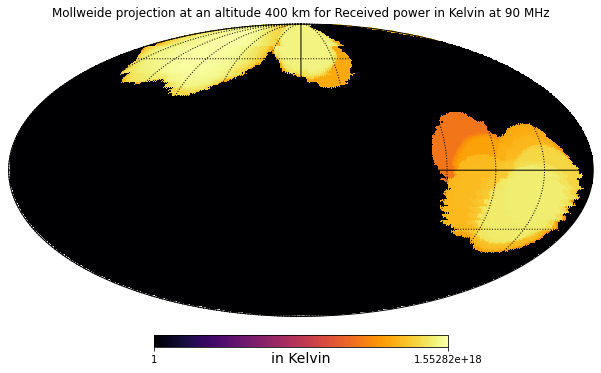

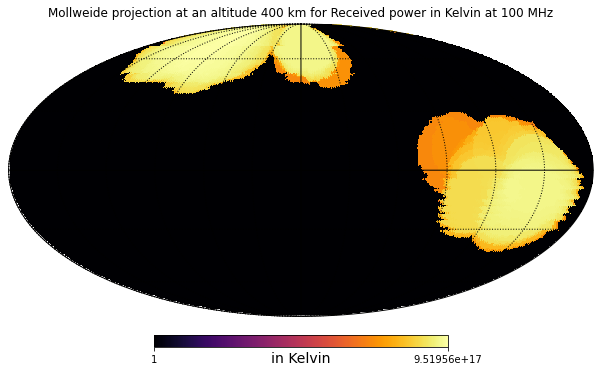

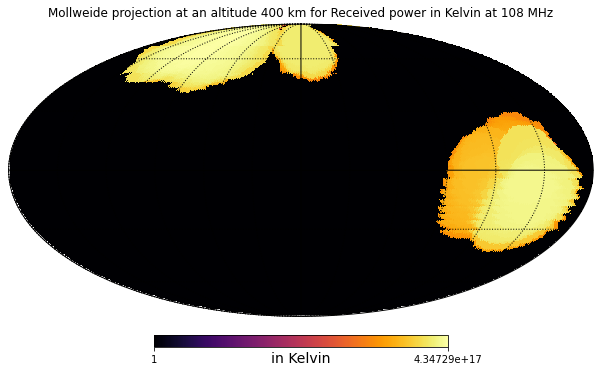

In [30]:
###3-------Plotting of the Healpy Map in mollweide projection------###
#####------For an altitude of 400 km----------------------#######


hp.mollview(m,cmap='inferno',unit="in Kelvin",title="Mollweide projection at an altitude 400 km for Received power in Kelvin at 90 MHz",flip='geo',norm="log")#,cb_orientation="vertical",title="Mollweide projection for Received power in Kelvin at 88.9MHz",flip='g')
hp.graticule()
hp.mollview(n,cmap='inferno',unit="in Kelvin",title="Mollweide projection at an altitude 400 km for Received power in Kelvin at 100 MHz",flip='geo',norm="log")#,cb_orientation="vertical",title="Mollweide projection for Received power in Kelvin at 88.9MHz")
hp.graticule()
hp.mollview(p,cmap='inferno',unit="in Kelvin",title="Mollweide projection at an altitude 400 km for Received power in Kelvin at 108 MHz",flip='geo',norm="log")#,cb_orientation="vertical",title="Mollweide projection for Received power in Kelvin at 88.9MHz")


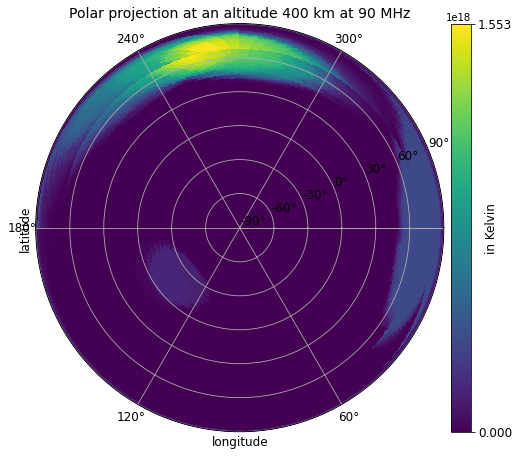

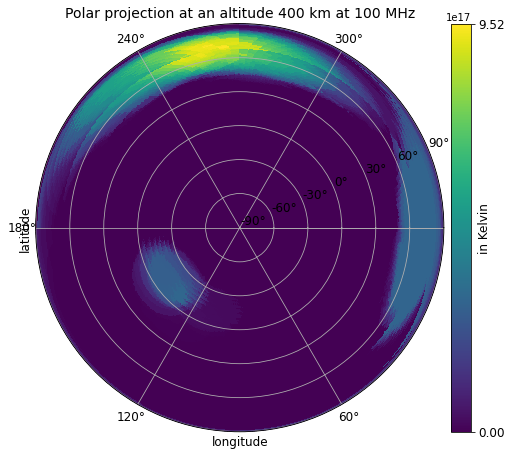

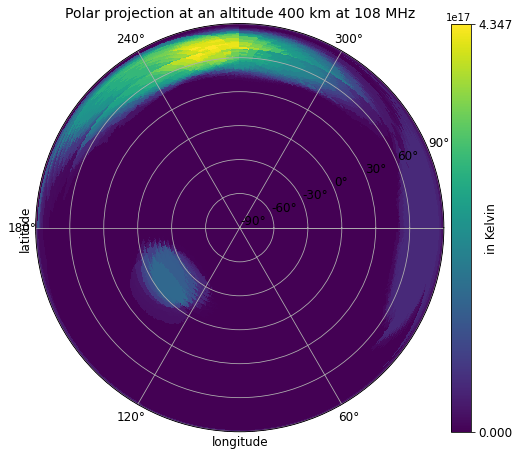

In [34]:
###-------Plotting of the Healpy Map in polar projection------###
#####------For an altitude of 400 km----------------------#######




hp.projview(
    m,
   
    graticule=True,
    graticule_labels=True,
    unit="in Kelvin",
    xlabel="longitude",
    ylabel="latitude",
    cb_orientation="vertical",
    projection_type="polar",
    title="Polar projection at an altitude 400 km at 90 MHz",
 
)

hp.projview(
    n,
   
    graticule=True,
    graticule_labels=True,
    unit="in Kelvin",
    xlabel="longitude",
    ylabel="latitude",
    cb_orientation="vertical",
    projection_type="polar",
    title="Polar projection at an altitude 400 km at 100 MHz",
   
)

hp.projview(
    p,
   
    graticule=True,
    graticule_labels=True,
    unit="in Kelvin",
    xlabel="longitude",
    ylabel="latitude",
    cb_orientation="vertical",
    projection_type="polar",
    title="Polar projection at an altitude 400 km at 108 MHz",
  
  
    
)